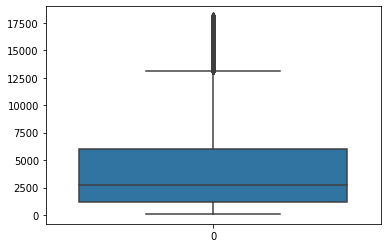

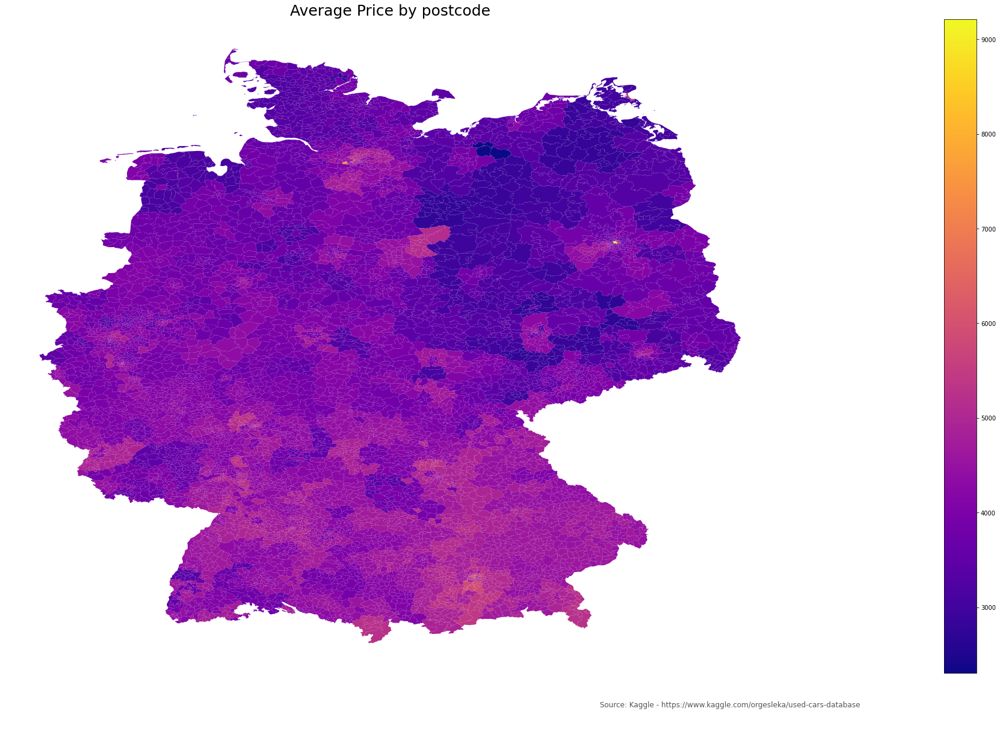

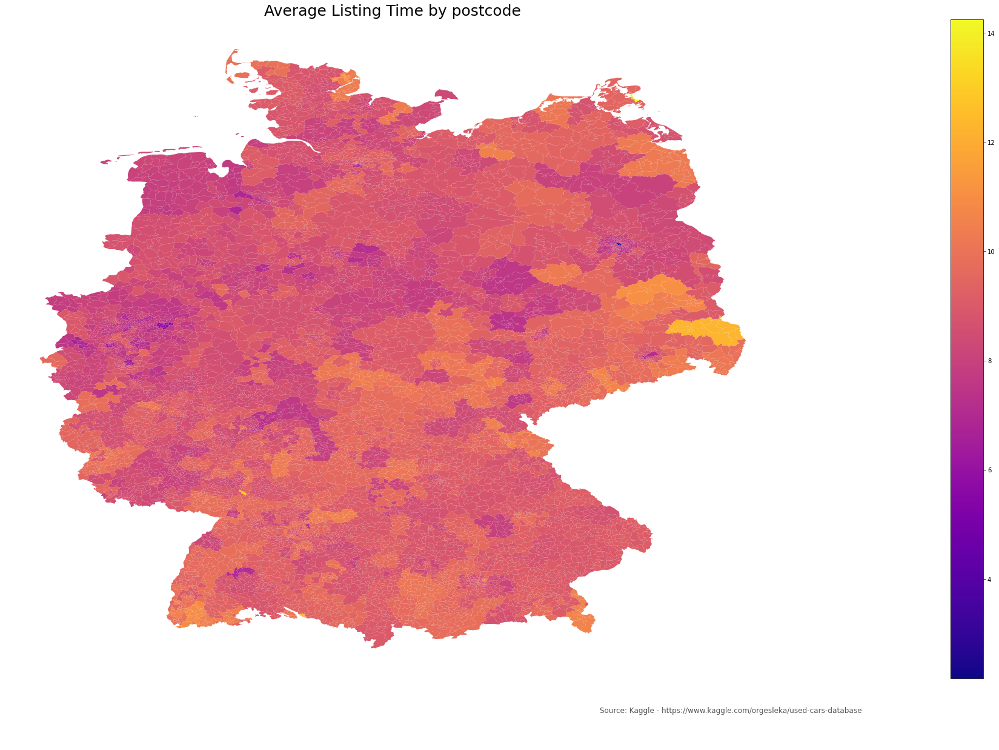

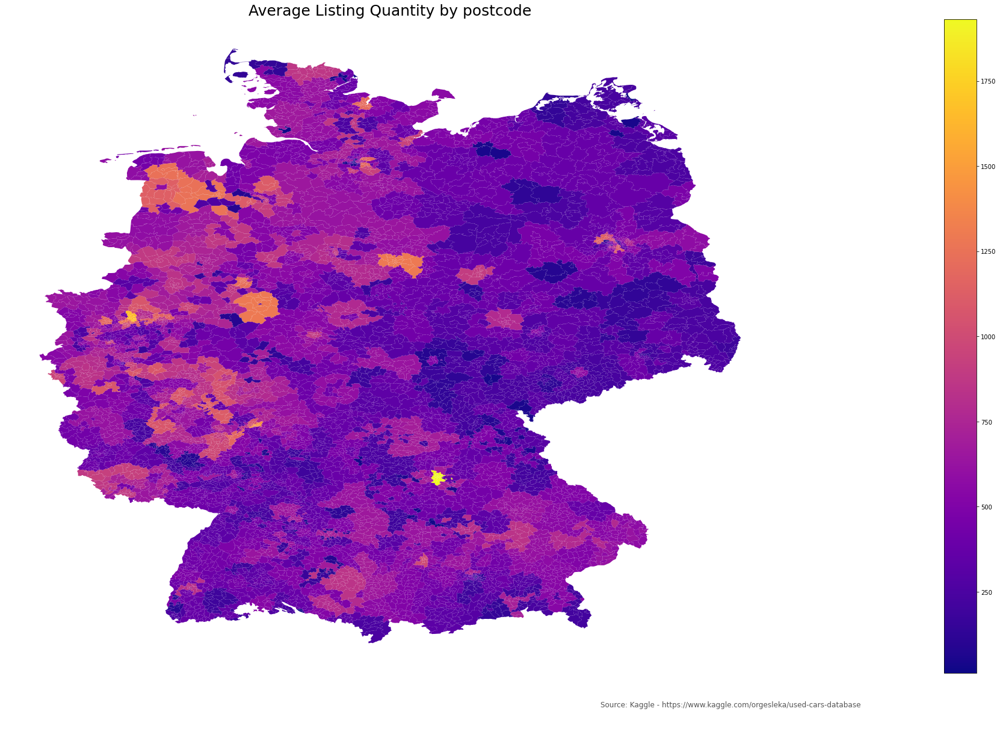

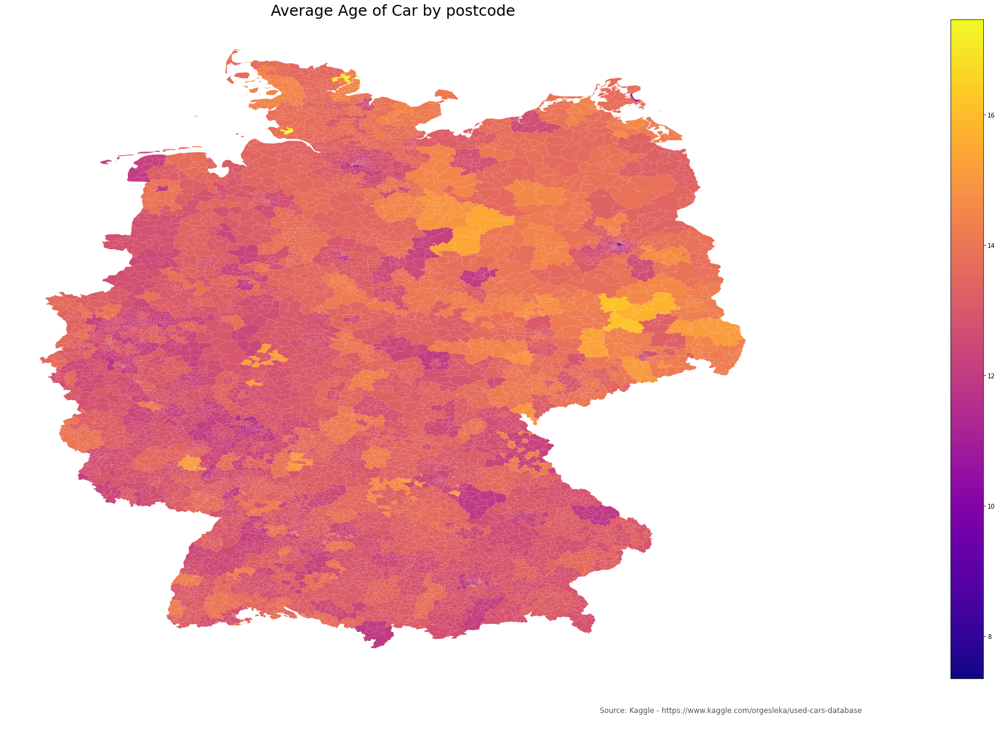

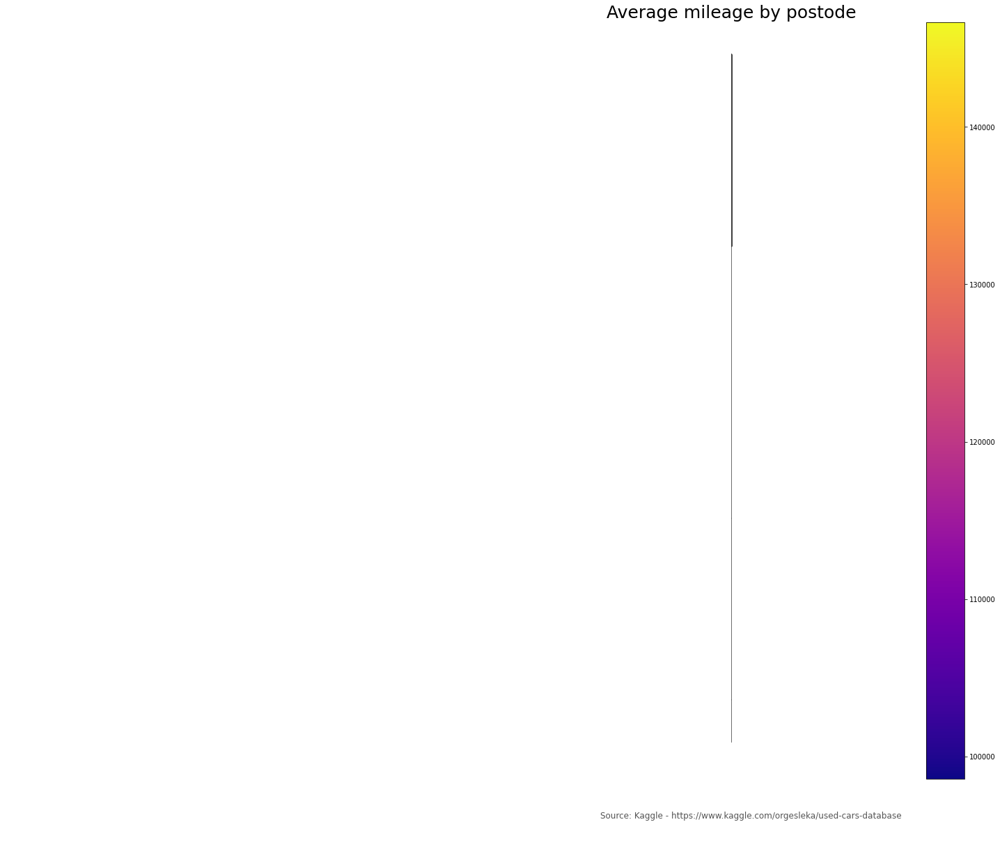

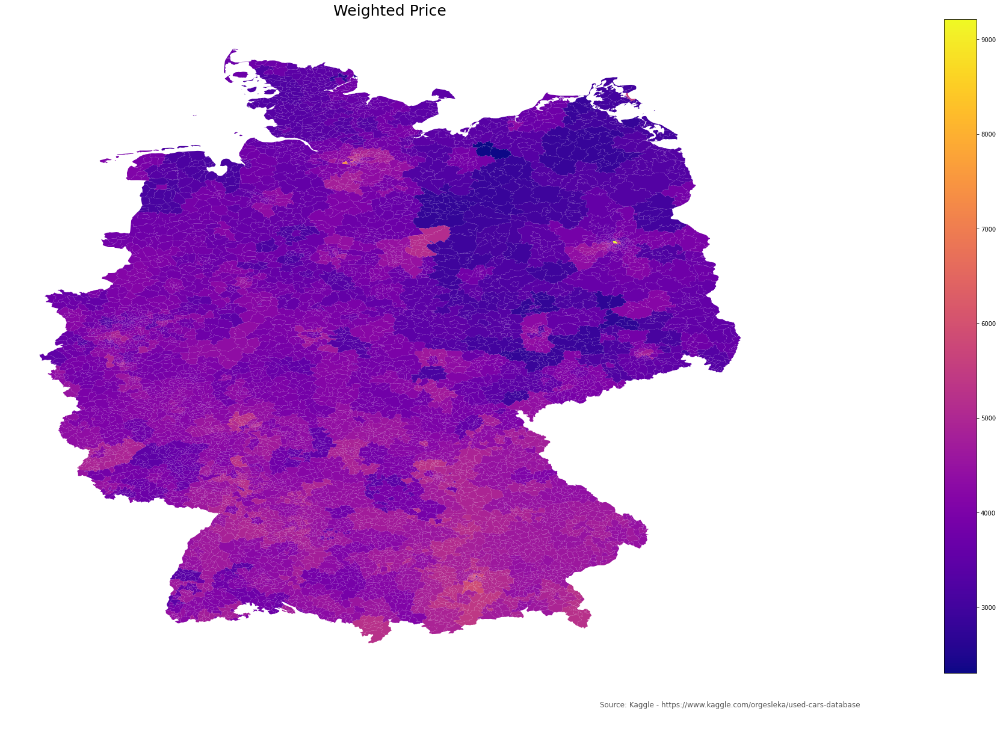

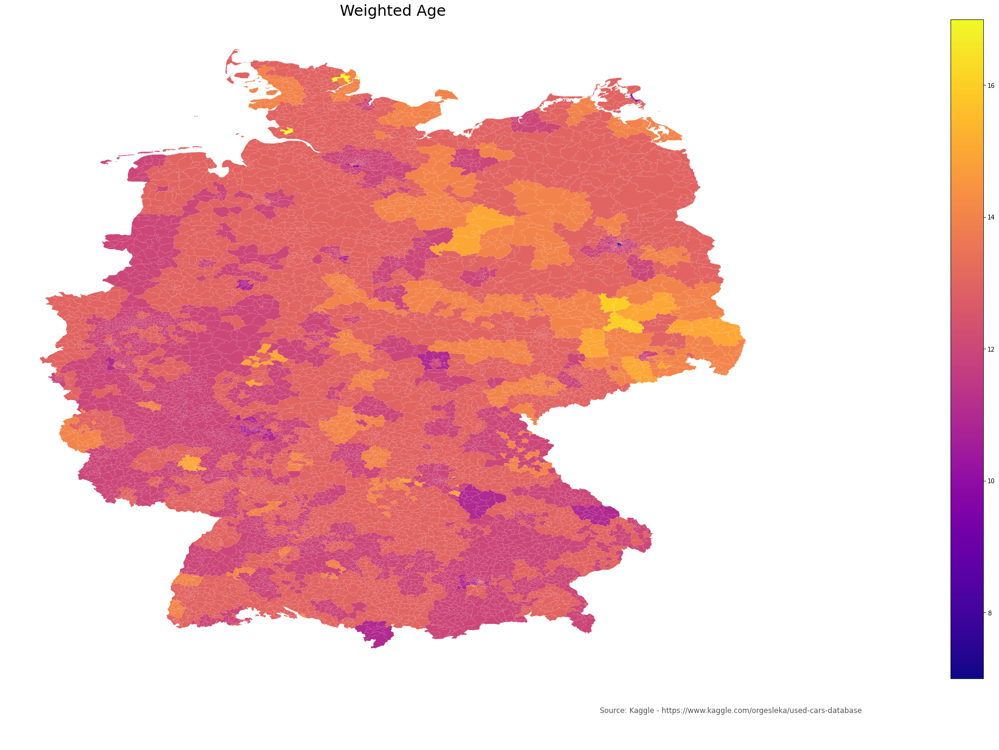

In [3]:
#First we need to clean and prepare the data
import pandas as pd
import numpy as np
import math
from collections import Counter
import sys
import os
from numpy import genfromtxt
import matplotlib.pyplot as plt
import geopandas as gpd
import dateutil
from sklearn.ensemble import IsolationForest
import seaborn as sns
#region size for mapping
size = 100

def calcAverage(dataset,name):
    newDf = pd.DataFrame(dataset)
    return newDf[name].mean()

def castToTrippleDataframe(x):
    
    indexNames = avg[ avg[0] == 0 ].index
    avg.drop(indexNames , inplace=True)
    avg['index1'] = avg.index
    return pd.DataFrame(avg.to_numpy(),columns = ['avg','weight','code'])

def computeWeighted(dataset, KEY,msg):
    averagePrice = np.zeros((len(dataset),),dtype=object)
    for i in unique_postcodes:
            newDf = pd.DataFrame(dataset[i])
            mode = 0
            try:
                mode = newDf.avgCode.mode()[0]
                newDict = {'mean': newDf[KEY].mean(),'weight' :len(newDf.index), 'code': mode}
                averagePrice[i] =  np.array(list(newDict.values())).astype(float)
            except IndexError:
                 averagePrice[i] = 0
                    
    mask = np.zeros((len(averagePrice),),dtype=object)
    j = 0
    for i in averagePrice:
        if(isinstance(i,int)):
            mask[j] = False
        else:
            mask[j] = True
        j = j +1

    newmask = np.array(mask, dtype=bool)

    avg = averagePrice[newmask]
    avg = pd.DataFrame(data=avg,columns=['values'])

    result = [] 
    for value in avg["values"]: 
            result.append(value[0]) 

    avg['mean'] = result  
    result = [] 
    for value in avg["values"]: 
            result.append(value[1])
    avg['weight'] = result  
    result = [] 
    for value in avg["values"]: 
            result.append(value[2])
    avg['code'] = result  

    avg.drop(["values"], axis=1, inplace=True)


    unique_codes = np.unique(avg[['code']].values)
    m = len(unique_codes)
    unique_codes = np.array(unique_codes, dtype=int)

    newdataset = np.zeros((int(unique_codes[m-1]+1),),dtype=object)

    for i in unique_codes:
        newdataset[i] = avg.loc[avg['code'] == i]

    finalPrice = np.zeros((len(newdataset),))
    for i in unique_codes:
            newDf = pd.DataFrame(newdataset[i])
            finalPrice[i] = math.ceil(np.average(newDf['mean'], weights = newDf.weight, axis = 0))

    finalPrice = castToDataframe(finalPrice)   
    if(KEY == 'yearOfRegistration'):
         finalPrice['avg'] = finalPrice['avg'].apply(lambda x: 2016-x)
            
    drawChoropleth(finalPrice,msg)

def castToDataframe(x):
    avg = pd.DataFrame(x)
    avg.index.name = 'postCode'
    indexNames = avg[ avg[0] == 0 ].index
    avg.drop(indexNames , inplace=True)
    avg['index1'] = avg.index
    return pd.DataFrame(avg.to_numpy(),columns = ['avg','postcode'])

def IsolationTreePK(df):
    df = df[df.price < 9999999]
    df = df[df.price >= 100] 
    new = df[['price', 'kilometer']].copy()
    return IsolationTree(new,df)
        
def IsolationTreeYK(df):
    new = df[['yearOfRegistration', 'kilometer']].copy()
    return IsolationTree(new,df)

def IsolationTreePY(df):
    df = df[df.price < 1000000000]
    df = df[df.price >= 100] 
    new = df[['price', 'yearOfRegistration']].copy()
    return IsolationTree(new,df)
    
def IsolationTree(new,df):
    p = new.to_numpy()
    clf = IsolationForest( behaviour = 'new', max_samples='auto', random_state = 1, contamination=float(.12))
    preds = clf.fit_predict(p)
    df['preds'] = preds
    df = df[df.preds > 0]
    
    sns.boxplot(data=df.price)
    return df

def AproximationalElimination(df):
    df = df[df.price <= 500000] 
    df = df[df.price > 100] #free and spoof listings
    return df

def drawChoropleth(avg,msg):
# join the geodataframe with the csv dataframe
    merged = map_df.merge(avg, how='left', left_on="avgCode", right_on="postcode")
#merged = merged[['', 'geometry', 'population_2015', 'area_km2', 'population_density_per_km2', \
                #'cities_regencies', 'cities', 'regencies']
    merged = merged[['PLZ99', 'PLZ99_N', 'PLZORT99', 'geometry', 'avg']]

    vmin = avg['avg'].min()
    vmax = avg['avg'].max()
    
# set the value column that will be visualised
    variable = 'avg'
# set the range for the choropleth values
    fig, ax = plt.subplots(1, figsize=(100, 20))

# remove the axis
    ax.axis('off')# add a title and annotation

    ax.set_title(msg, fontdict={'fontsize': '25', 'fontweight' : '3'})
    ax.annotate('Source: Kaggle - https://www.kaggle.com/orgesleka/used-cars-database', xy=(0.6, .05), xycoords='figure fraction', fontsize=12, color='#555555')# Create colorbar legend
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))

# empty array for the data range
    sm.set_array([]) # or alternatively sm._A = []. Not sure why this step is necessary, but many recommends it
    
    
# add the colorbar to the figure
    fig.colorbar(sm)# create map
    merged.plot(column=variable, cmap= 'plasma', linewidth=0, ax=ax, edgecolor='0.8')#here
    
def computeGraphs(df):
    unique_codes = np.unique(df[['avgCode']].values)
    n = len(unique_codes)
    #construct the dataset grouped by postcode.
    dataset = np.zeros((unique_codes[n-1]+1,),dtype=object)

    for i in unique_codes:
        dataset[i] = df.loc[df['avgCode'] == i]

    dataset.shape
    

#Things to test for

    #price
    averagePrice = np.zeros((len(dataset),))
    for i in unique_codes:
            k = calcAverage(dataset[i],'price')
            averagePrice[i] = k
    averagePrice = castToDataframe(averagePrice)
    
    #mileage
    averageMileage = np.zeros((len(dataset),))
    for i in unique_codes:
        k = calcAverage(dataset[i],'kilometer')
        averageMileage[i] = k
    averageMileage = castToDataframe(averageMileage)

    #age of car
    averageAge = np.zeros((len(dataset),))
    for i in unique_codes:
        k = calcAverage(dataset[i],'yearOfRegistration')
        averageAge[i] = k
    averageAge = castToDataframe(averageAge)
    averageAge['avg'] = averageAge['avg'].apply(lambda x: 2016-x)
        
    #listing time
    averageTime = np.zeros((len(dataset),))
    for i in unique_codes:
        k = calcAverage(dataset[i],'dura')
        averageTime[i] = k
    averageTime = castToDataframe(averageTime)
            
    #listing quantity
    averageQuantity = np.zeros((len(dataset),))
    for i in unique_codes:
        k = (dataset[i].shape[0])
        averageQuantity[i] = k
    averageQuantity = castToDataframe(averageQuantity)
        
    
    #night time listings
    drawChoropleth(averagePrice,"Average Price by postcode")
    drawChoropleth(averageTime,"Average Listing Time by postcode")
    drawChoropleth(averageQuantity,"Average Listing Quantity by postcode")
    drawChoropleth(averageAge,"Average Age of Car by postcode")
    drawChoropleth(averageMileage,"Average mileage by postode")

def parse(x):
    try:
        strX = str(x)[:19]
        return dateutil.parser.parse(strX).date()#parse the string into a datetime
    except ValueError:
        return dateutil.parser.parse('1-April-2016').date()#default time fail
    
#READ IN DATA------------------------------------------------------
datasource = pd.read_csv('autos.csv', encoding="ISO-8859-1")
df = pd.DataFrame(datasource)
df.price = df.price.astype(np.uint32)
df.kilometer = df.kilometer.astype(np.uint32)
df.powerPS = df.powerPS.astype(np.uint16)
df.monthOfRegistration = df.monthOfRegistration.astype(np.uint8)
df.yearOfRegistration = df.yearOfRegistration.astype(np.uint16)
df.postalCode = df.postalCode.astype(np.uint32)
        
 #Pictures was broken, offertype and seller are constant through the listings and thus not usefull. 
df.drop(["nrOfPictures", "abtest", "offerType", "seller"], axis=1, inplace=True)
    
fuelRemap = {'benzin' : 'P', 'diesel' : 'D'} 
gearboxRemap = {'manuell' : 'M', 'automatik' : 'A'}
df.fuelType = df.fuelType.map(fuelRemap) 
df.gearbox = df.gearbox.map(gearboxRemap) 
df.replace({'gearbox': gearboxRemap}) 
df = df[df.price <= 9999999] #for gods sake no car sold for 10 mil on german ebay


df['dura'] = df['lastSeen'].apply(parse) - df['dateCreated'].apply(parse)
df['dura'] = df['dura'].apply(lambda x: x.days)

#normalize the post codes in the map to regions of the nearest size
df['avgCode'] =df['postalCode']
df.avgCode = df.avgCode.apply(lambda x : (int)(x / size) * size)
df['codeCount'] = df.groupby('postalCode')['postalCode'].transform('count')
df.to_csv(r'autosFixed.csv', index = False)
Base_DataSet = df
#END READ------------------------------------------------------
    
#COLLECT POSTCODES----------------------
unique_brands = np.unique(df[['brand']].values)
unique_postcodes = np.unique(df[['postalCode']].values)  

n = len(unique_postcodes)

#READ IN MAP----------------------------
fp = "post_pl.shp"
map_df = gpd.read_file(fp)
map_df['PLZ99']=map_df['PLZ99'].astype(int)

#add a new col.
map_df['avgCode'] = map_df['PLZ99']
map_df.avgCode = map_df.avgCode.apply(lambda x : (int)(x / size) * size)


#fix bad ages by setting them to the weighted average
df['Count'] = df.groupby('yearOfRegistration')['yearOfRegistration'].transform('count')
df_test = df[['yearOfRegistration','Count']]

df_test = df_test[df_test.yearOfRegistration >= 1930]# we only want to base this average off real ages
df_test = df_test[df_test.yearOfRegistration < 2020]# we only want to base this average off real ages
avyear =  math.ceil(np.average(df_test.yearOfRegistration, weights = df_test.Count, axis = 0))
#print(avyear)
stdyear = math.ceil(df_test.loc[:,"yearOfRegistration"].std())
#print(stdyear)


#replace bad years with weighted average +- std deviation
df['yearOfRegistration'] = np.where((df.yearOfRegistration <= 1930),np.random.randint(avyear-stdyear,avyear+stdyear),df.yearOfRegistration)
df['yearOfRegistration'] = np.where((df.yearOfRegistration >= 2020),np.random.randint(avyear-stdyear,avyear+stdyear),df.yearOfRegistration)
df.drop(["Count"], axis=1, inplace=True)

#computeGraphs(AproximationalElimination(Base_DataSet))
computeGraphs(IsolationTreePK(Base_DataSet))
#computeGraphs(IsolationTreeYK(Base_DataSet))
#computeGraphs(IsolationTreePY(Base_DataSet))


#change to weighted average by postalcode
df = IsolationTreePK(Base_DataSet)

unique_groupcodes = np.unique(df[['avgCode']].values)  
dataset = np.zeros((unique_postcodes[n-1]+1,),dtype=object)
#Avgdataset = np.zeros((unique_groupcodes[n-1]+1,),dtype=object)
for i in unique_postcodes:
        dataset[i] = df.loc[df['postalCode'] == i]
        
computeWeighted(dataset,'price','Weighted Price')
computeWeighted(dataset,'yearOfRegistration','Weighted Age')


In [ ]:
#computeGraphs(AproximationalElimination(Base_DataSet))

In [ ]:
#computeGraphs(IsolationTreeYK(Base_DataSet))
#computeGraphs(IsolationTreePY(Base_DataSet))

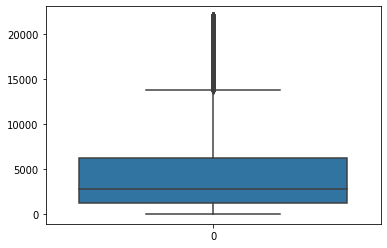

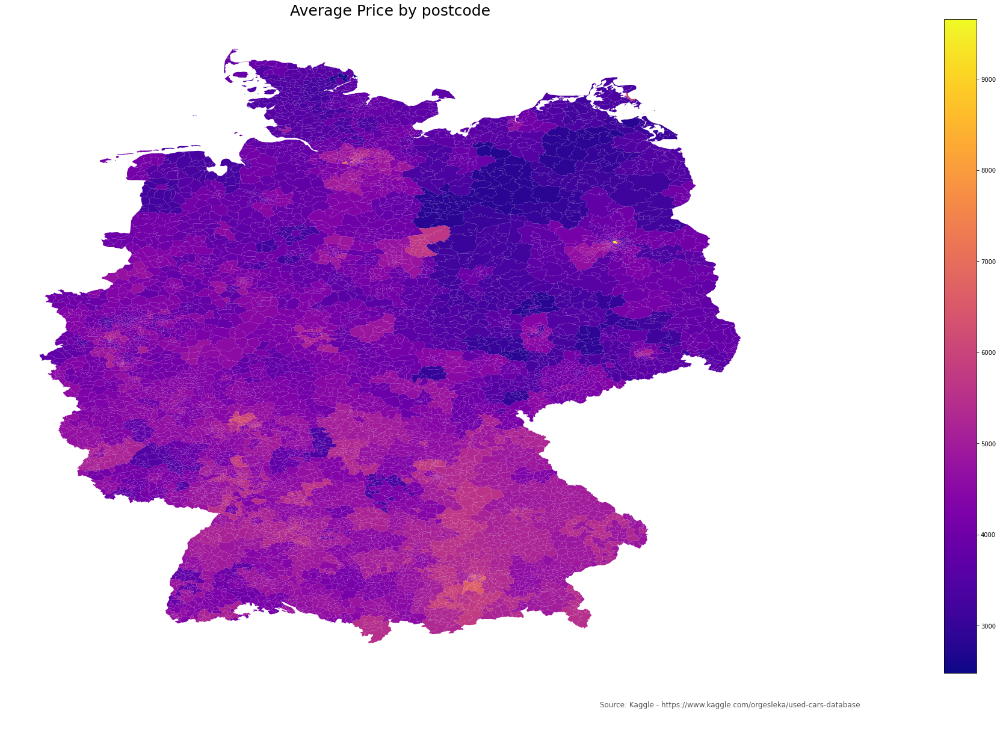

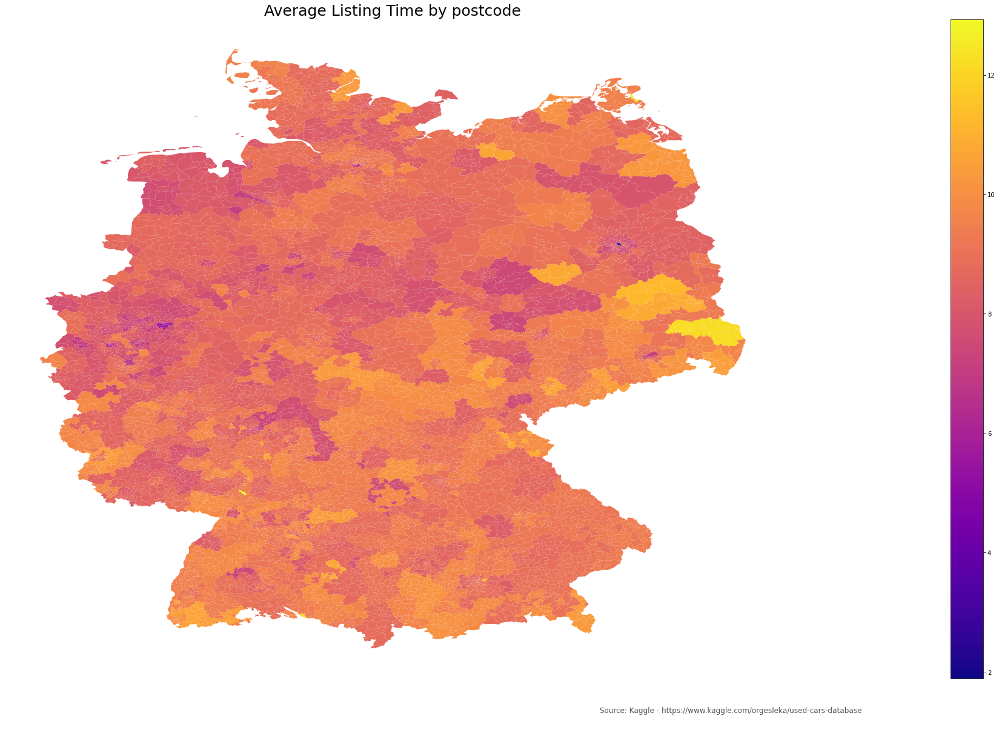

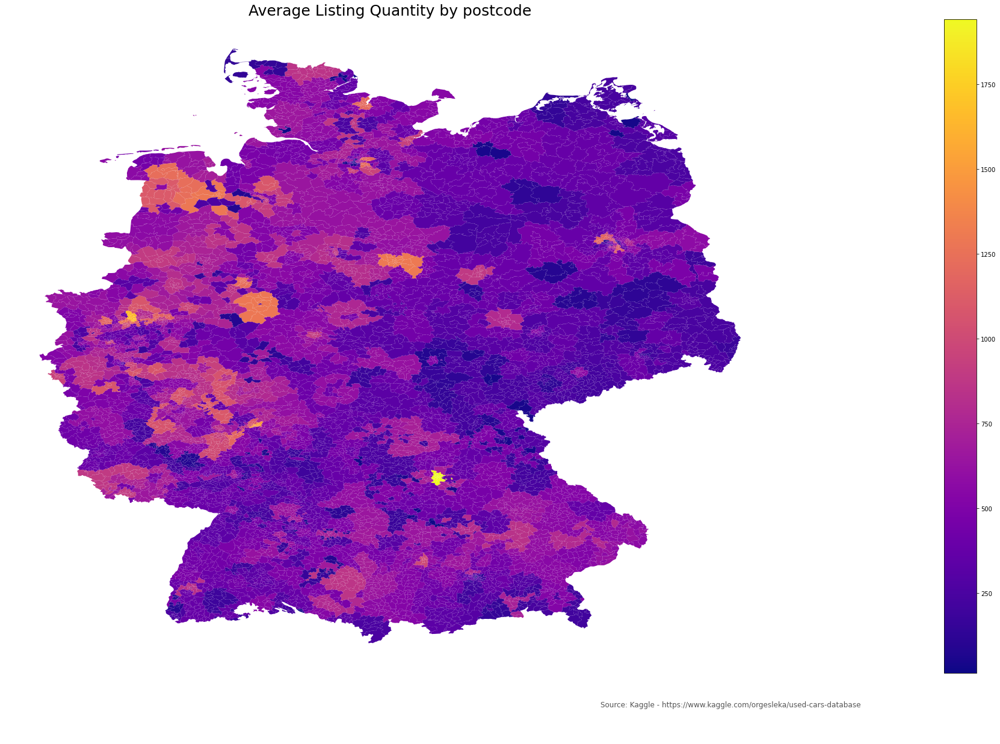

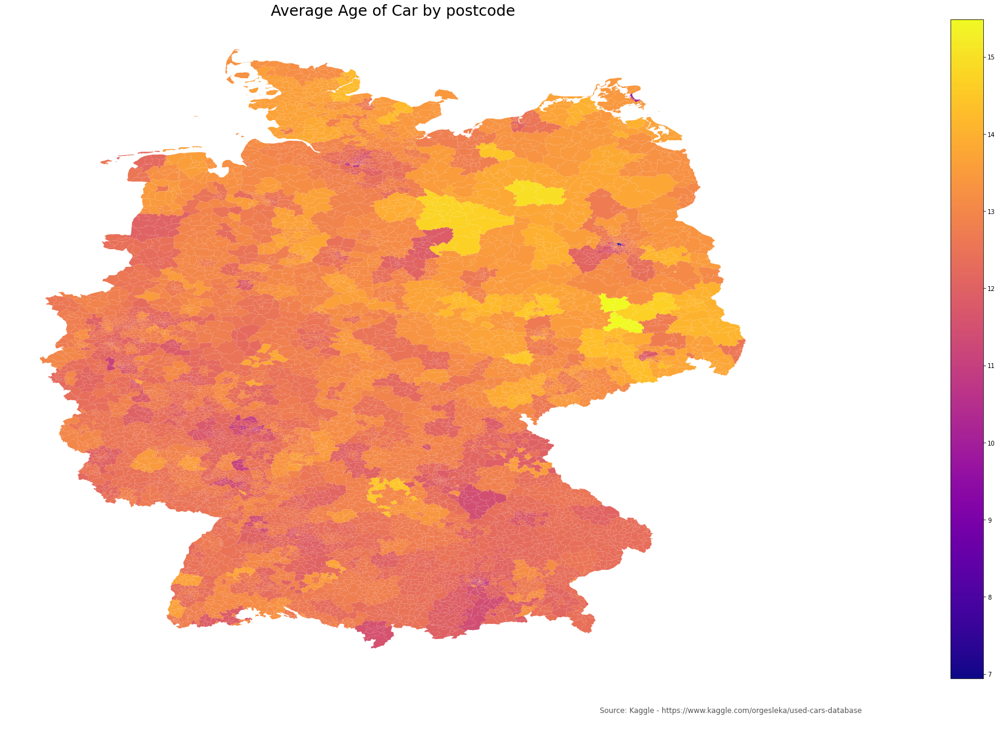